In [1]:
import os
import warnings
warnings.filterwarnings('ignore')

import scanpy as sc
import anndata as ad
import pandas as pd
import seaborn as sns
from statannotations.Annotator import Annotator

In [2]:
out_dir = '../../results/05_fibroblast/01_clustering'

In [3]:
os.makedirs(out_dir, exist_ok=True)

In [4]:
adata = sc.read_h5ad('../../results/03_integrate_scrna/integrated.h5ad')

In [5]:
# update dataset name
adata.obs['data'] = adata.obs['data'].str.replace(r'cell_2022', 'Gur2022', regex=True)
adata.obs['data'] = adata.obs['data'].str.replace(r'nc_2021', 'Tabib2021', regex=True)

In [6]:
adata

AnnData object with n_obs × n_vars = 95898 × 15275
    obs: 'patient_id', 'condition', 'cell_type', 'data', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'pct_counts_mt'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'mt', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'cell_type_colors', 'condition_colors', 'data_colors', 'hvg', 'log1p', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [7]:
adata.raw = adata.copy()

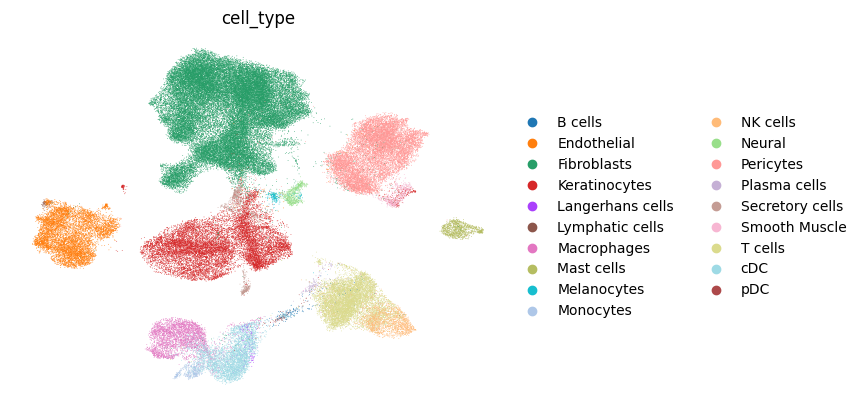

In [8]:
sc.pl.umap(adata, color=['cell_type'], frameon=False)

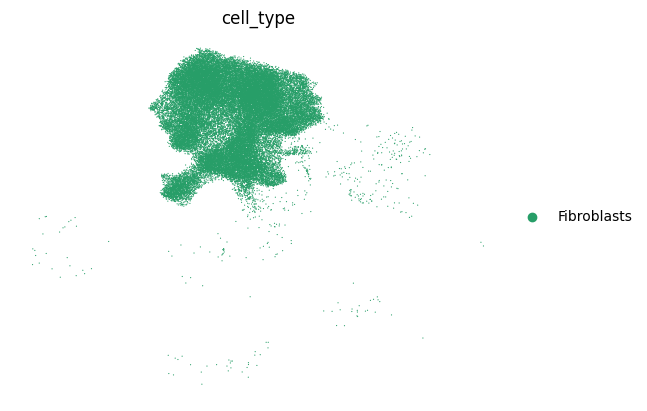

In [9]:
# subset all fibroblast cells
adata = adata[adata.obs['cell_type'] == "Fibroblasts", :].copy()
sc.pl.umap(adata, color=['cell_type'], frameon=False)

In [10]:
# remove patients with two few cells
df_count = adata.obs['patient_id'].value_counts()
sel_patients = df_count[df_count > 100].index.tolist()

adata = adata[adata.obs['patient_id'].isin(sel_patients)].copy()

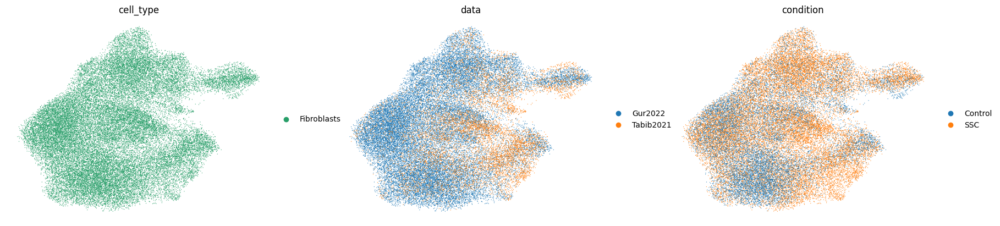

In [11]:
sc.pp.neighbors(adata, use_rep='X_pca_harmony', n_neighbors=30)
sc.tl.umap(adata)
sc.pl.umap(adata, color=['cell_type', 'data', 'condition'], frameon=False)

In [12]:
sc.tl.leiden(adata, key_added="leiden", resolution=1)

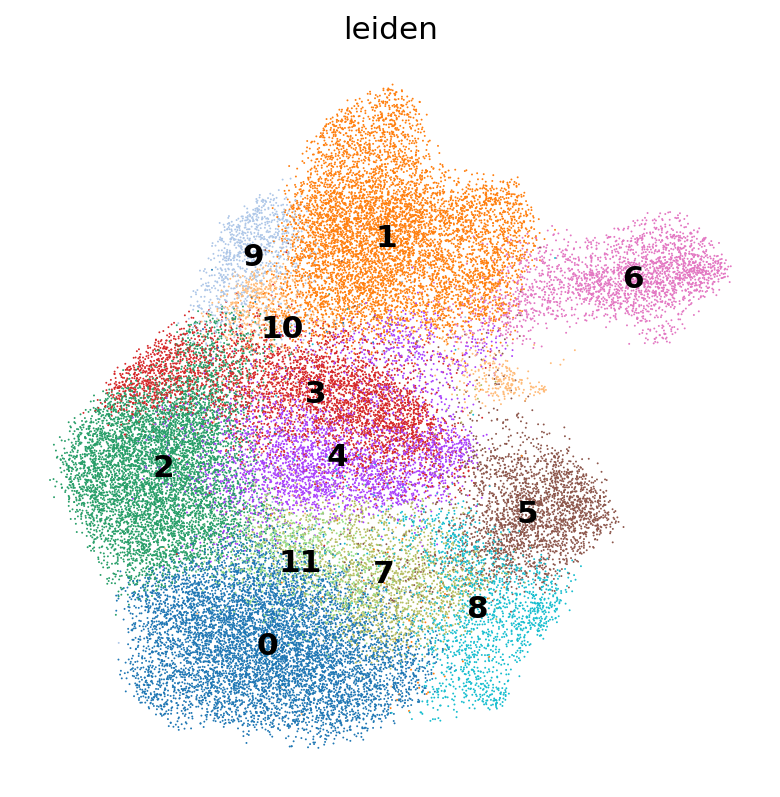

In [13]:
sc.set_figure_params(figsize=(6, 6))

sc.pl.umap(adata, color=['leiden'], frameon=False, legend_loc='on data')

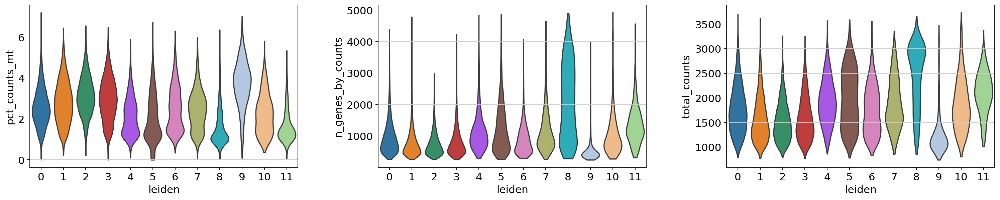

In [14]:
sc.set_figure_params(figsize=(6, 4))

sc.pl.violin(adata, ['pct_counts_mt', 'n_genes_by_counts', 'total_counts'],
             jitter=0.4, multi_panel=True, groupby='leiden', size=0)

In [15]:
# remove cluster 9
adata = adata[~adata.obs['leiden'].isin(['9']), :].copy()

# merge cluster 4 and 11
adata.obs['leiden'] = adata.obs['leiden'].str.replace('11', '4', regex=True)

In [16]:
# re-do umap
sc.tl.umap(adata)

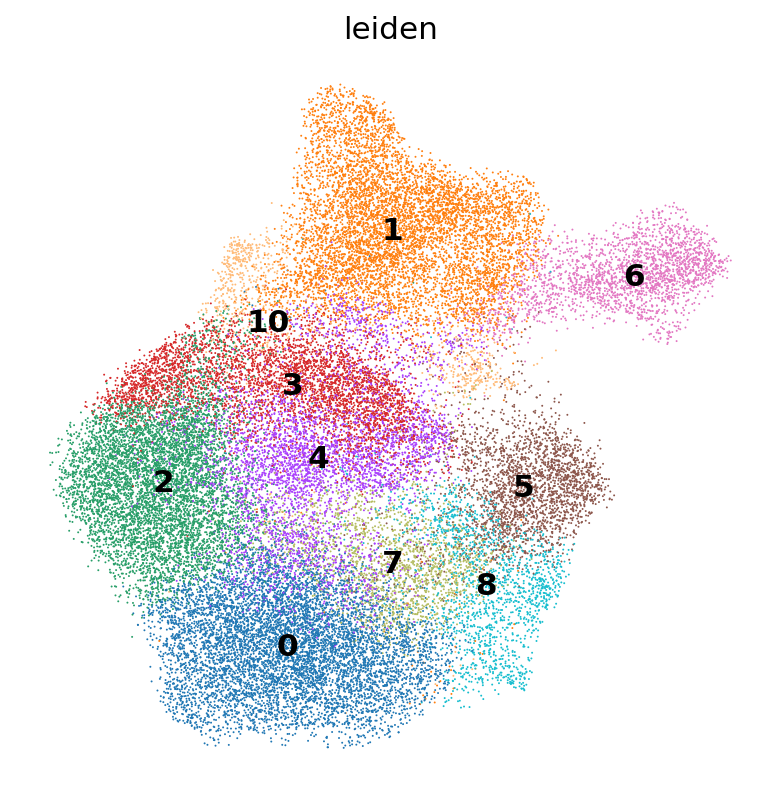

In [17]:
sc.set_figure_params(figsize=(6, 6))

sc.pl.umap(adata, color=['leiden'], frameon=False, legend_loc='on data')

In [18]:
# for conveniences, we here rename the sub-clusters as Fib1 to Fib10
adata.obs['sub_clusters'] = adata.obs['leiden']
adata.obs['sub_clusters'] = adata.obs['sub_clusters'].str.replace(r'\b0\b', 'Fib1', regex=True)
adata.obs['sub_clusters'] = adata.obs['sub_clusters'].str.replace(r'\b1\b', 'Fib2', regex=True)
adata.obs['sub_clusters'] = adata.obs['sub_clusters'].str.replace(r'\b2\b', 'Fib3', regex=True)
adata.obs['sub_clusters'] = adata.obs['sub_clusters'].str.replace(r'\b3\b', 'Fib4', regex=True)
adata.obs['sub_clusters'] = adata.obs['sub_clusters'].str.replace(r'\b4\b', 'Fib5', regex=True)
adata.obs['sub_clusters'] = adata.obs['sub_clusters'].str.replace(r'\b5\b', 'Fib6', regex=True)
adata.obs['sub_clusters'] = adata.obs['sub_clusters'].str.replace(r'\b6\b', 'Fib7', regex=True)
adata.obs['sub_clusters'] = adata.obs['sub_clusters'].str.replace(r'\b7\b', 'Fib8', regex=True)
adata.obs['sub_clusters'] = adata.obs['sub_clusters'].str.replace(r'\b8\b', 'Fib9', regex=True)
adata.obs['sub_clusters'] = adata.obs['sub_clusters'].str.replace(r'\b10\b', 'Fib10', regex=True)

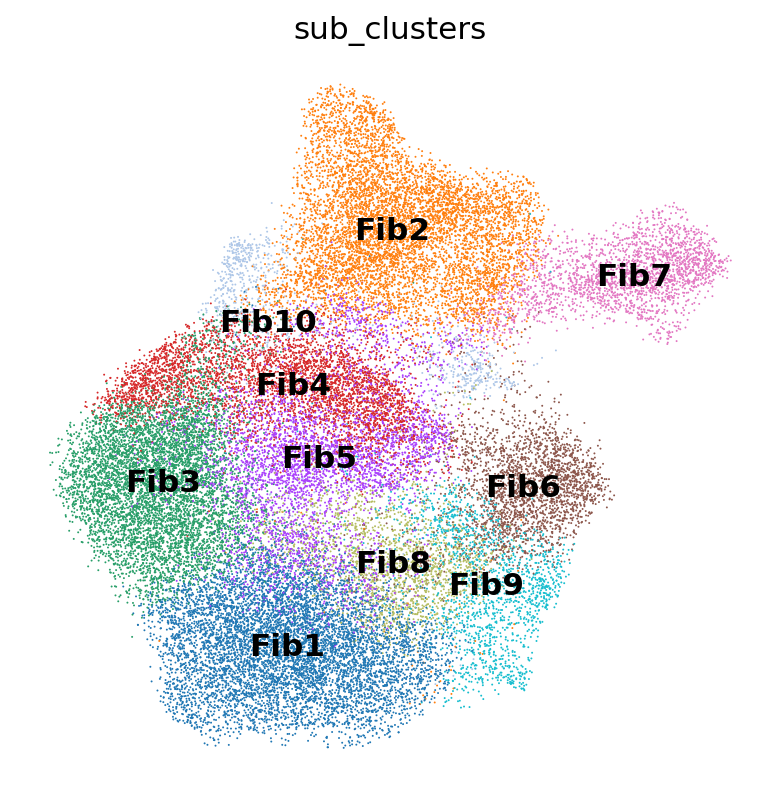

In [19]:
sc.pl.umap(adata, color=['sub_clusters'], frameon=False, legend_loc='on data')

In [20]:
# find marker genes
adata.uns['log1p']['base'] = None
sc.tl.rank_genes_groups(adata, 'sub_clusters', method='wilcoxon')
result = adata.uns['rank_genes_groups']

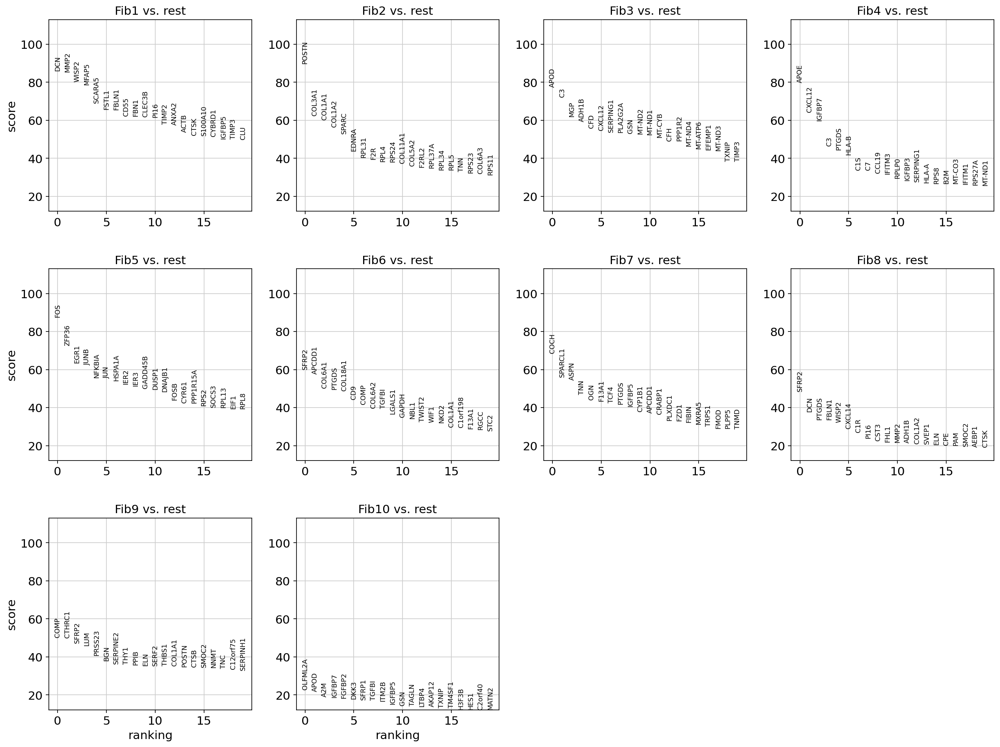

In [21]:
sc.set_figure_params(figsize=(5, 5))
sc.pl.rank_genes_groups(adata)

In [37]:
df = pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(200)
df.to_csv(f'{out_dir}/top_200.csv', index=False)

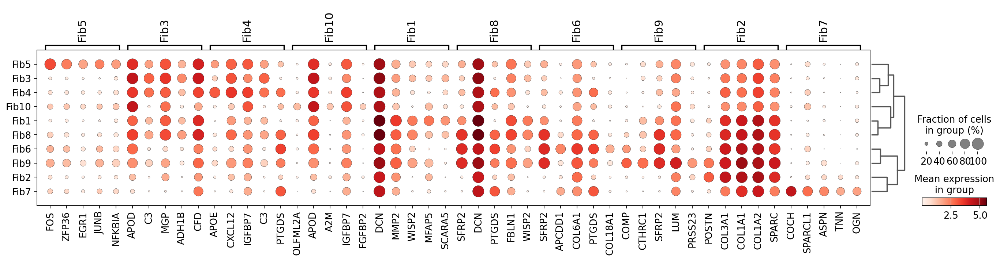

In [38]:
sc.pl.rank_genes_groups_dotplot(adata, n_genes=5)

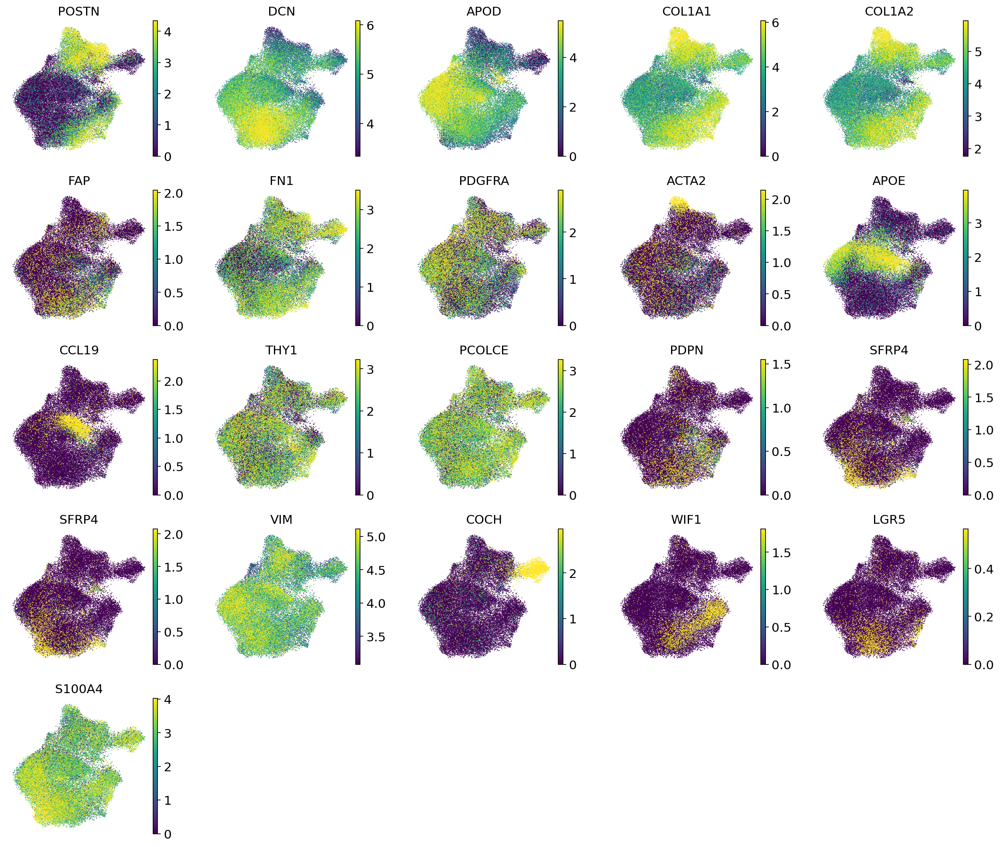

In [23]:
sc.set_figure_params(figsize=(3, 3))

sc.pl.umap(adata, color=['POSTN', 'DCN', 'APOD','COL1A1','COL1A2','FAP','FN1','PDGFRA','ACTA2','APOE',
                         'CCL19','THY1','PCOLCE','PDPN','SFRP4','SFRP4','VIM','COCH',
                         'WIF1','LGR5','S100A4'], frameon=False, vmax='p95', vmin='p5', ncols=5)

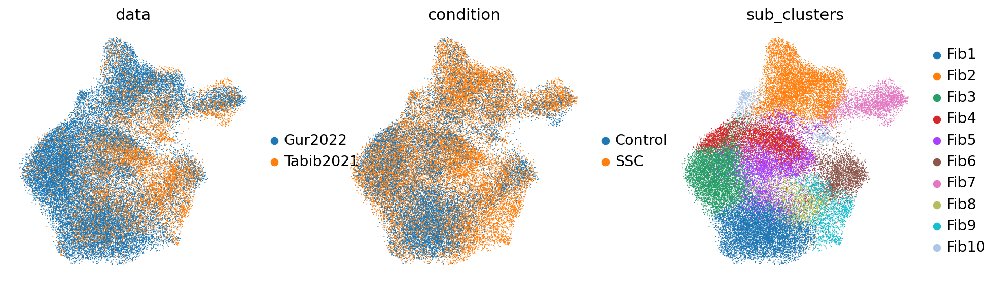

In [24]:
sc.set_figure_params(figsize=(4, 4))
sc.pl.umap(adata, color=['data', 'condition', 'sub_clusters'], frameon=False, ncols=3)

In [25]:
# we can compute the cell-type composition between control and SSc
df_prop = pd.crosstab(adata.obs['patient_id'],adata.obs['sub_clusters'], normalize='index').reset_index()
df_obs = adata.obs[['patient_id', 'condition']].drop_duplicates()
df_prop = pd.melt(df_prop, id_vars=['patient_id'], value_name='proportion')
df = df_prop.merge(df_obs)

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Fib10_Control vs. Fib10_SSC: Mann-Whitney-Wilcoxon test two-sided, P_val:9.040e-03 U_stat=1.320e+03
Fib9_Control vs. Fib9_SSC: Mann-Whitney-Wilcoxon test two-sided, P_val:7.404e-14 U_stat=3.840e+02
Fib2_Control vs. Fib2_SSC: Mann-Whitney-Wilcoxon test two-sided, P_val:5.721e-05 U_stat=1.043e+03
Fib1_Control vs. Fib1_SSC: Mann-Whitney-Wilcoxon test two-sided, P_val:3.452e-10 U_stat=3.065e+03
Fib3_Control vs. Fib3_SSC: Mann-Whitney-Wilcoxon test two-sided, P_val:3.117e-01 U_stat=2.032e+03
Fib4_Control vs. Fib4_SSC: Mann-Whitney-Wilcoxon test two-sided, P_val:1.231e-01 U_stat=1.530e+03
Fib5_Control vs. Fib5_SSC: Mann-Whitney-Wilcoxon test two-sided, P_val:8.446e-02 U_stat=1.494e+03
Fib6_Control vs. Fib6_SSC: Mann-Whitney-Wilcoxon test two-sided, P_val:2.996e-01 U_stat=2.037e+03
Fib7_Control vs. Fib7_

(<Axes: xlabel='sub_clusters', ylabel='proportion'>,
  <statannotations.Annotation.Annotation at 0x7f04add0a290>])

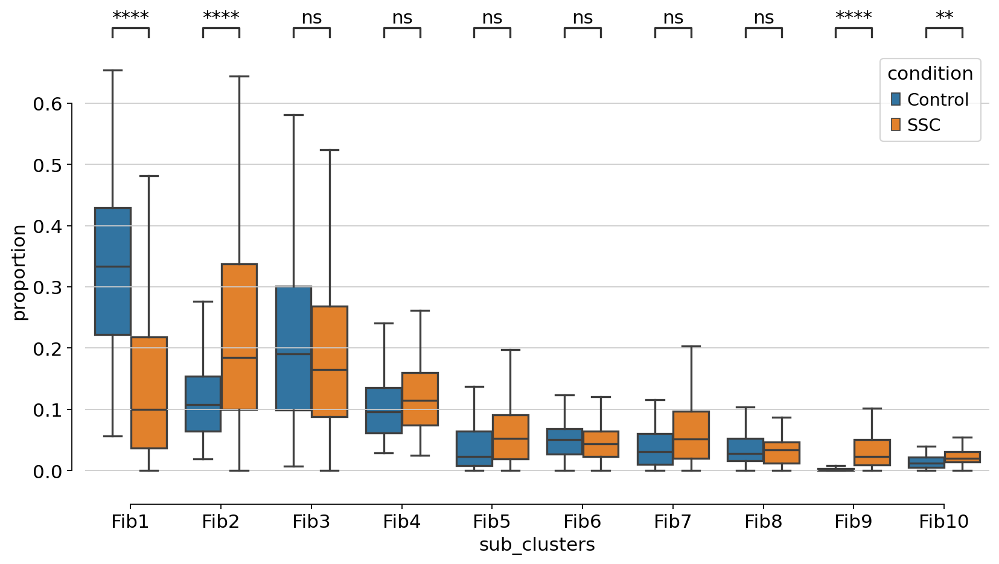

In [26]:
# visualize cell type proportion
sc.set_figure_params(figsize=(12, 6))
ax = sns.boxplot(data=df, 
                 x='sub_clusters', y='proportion', 
                 hue="condition", 
                 showfliers = False)
sns.despine(offset=10, trim=True, ax=ax)

pairs=[(('Fib1', "Control"), ('Fib1', "SSC")),
      (('Fib2', "Control"), ('Fib2', "SSC")),
      (('Fib3', "Control"), ('Fib3', "SSC")),
      (('Fib4', "Control"), ('Fib4', "SSC")),
      (('Fib5', "Control"), ('Fib5', "SSC")),
      (('Fib6', "Control"), ('Fib6', "SSC")),
      (('Fib7', "Control"), ('Fib7', "SSC")),
      (('Fib8', "Control"), ('Fib8', "SSC")),
       (('Fib9', "Control"), ('Fib9', "SSC")),
      (('Fib10', "Control"), ('Fib10', "SSC"))]

annotator = Annotator(ax, pairs, data=df, x='sub_clusters', y='proportion', hue='condition')
annotator.configure(test='Mann-Whitney', text_format='star', loc='outside')
annotator.apply_and_annotate()

In [27]:
adata.write_h5ad(f'{out_dir}/fibroblast.h5ad')

In [3]:
adata = sc.read_h5ad(f'{out_dir}/fibroblast.h5ad')

In [4]:
# we can compute the cell-type composition between control and SSc
df_prop = pd.crosstab(adata.obs['patient_id'],adata.obs['sub_clusters'], normalize='index').reset_index()
df_obs = adata.obs[['patient_id', 'condition']].drop_duplicates()
df_prop = pd.melt(df_prop, id_vars=['patient_id'], value_name='proportion')
df = df_prop.merge(df_obs)

In [6]:
df.to_csv(f'{out_dir}/fibroblast_prop_in_patient.csv')